# **ImageNet Classifier**

In [1]:
import tensorflow as tf

In [2]:
# other imports
import tensorflow_hub as hub
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# Classifier URL from the Tensorflow Hub
classifier_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4" 
IMAGE_SHAPE = (224, 224)

In [4]:
# create a model
classifier = tf.keras.Sequential([
    hub.KerasLayer(classifier_url, input_shape = IMAGE_SHAPE+(3,))
])

In [5]:
# set up URLs for image downloads
image_url1 = "https://raw.githubusercontent.com/Apress/artificial-neural-networks-with-tensorflow-2/main/Ch04/bulck_cart.jpg"
image_url2 = "https://raw.githubusercontent.com/Apress/artificial-neural-networks-with-tensorflow-2/main/Ch04/flower.jpg"
image_url3 = "https://raw.githubusercontent.com/Apress/artificial-neural-networks-with-tensorflow-2/main/Ch04/swordweapon.jpg"
image_url4 = "https://raw.githubusercontent.com/Apress/artificial-neural-networks-with-tensorflow-2/main/Ch04/tiger.jpg"
image_url5 = "https://raw.githubusercontent.com/Apress/artificial-neural-networks-with-tensorflow-2/main/Ch04/tree.jpg"

In [6]:
# download images
!pip install wget
import wget 

wget.download(image_url1, 'image1.jpg')
wget.download(image_url2, 'image2.jpg')
wget.download(image_url3, 'image3.jpg')
wget.download(image_url4, 'image4.jpg')
wget.download(image_url5, 'image5.jpg')

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=cc3b873a2958f7552be0ad0009fe23f6ec623fc5ebcb555f6a1f9deffa316231
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


'image5.jpg'

In [7]:
from tensorflow.python.training.tracking.data_structures import NoDependency
# load images and reshape it to 224x224 required by the model
import PIL.Image as Image

image1 = tf.keras.utils.get_file("/content/image1.jpg", image_url1)
image1 = Image.open(image1).resize(IMAGE_SHAPE)
# scale the array 
image1 = np.array(image1)/255.0

image2 = tf.keras.utils.get_file("/content/image2.jpg" ,image_url2)
image2 = Image.open(image2).resize(IMAGE_SHAPE)
# scale the array 
image2 = np.array(image2)/255.0

image3 = tf.keras.utils.get_file("/content/image3.jpg", image_url3)
image3 = Image.open(image3).resize(IMAGE_SHAPE)
# scale the array 
image3 = np.array(image3)/255.0

image4 = tf.keras.utils.get_file("/content/image4.jpg", image_url4)
image4 = Image.open(image4).resize(IMAGE_SHAPE)
# scale the array 
image4 = np.array(image4)/255.0

image5 = tf.keras.utils.get_file("/content/image5.jpg", image_url5)
image5 = Image.open(image5).resize(IMAGE_SHAPE)
# scale the array 
image5 = np.array(image5)/255.0

In [8]:
# infer first image
result = classifier.predict(image1[np.newaxis, ...])
result.shape

(1, 1001)

In [9]:
# pick up the bottom most prediction
predicted_class = np.argmax(result[0], axis=-1)
predicted_class

691

In [10]:
# Load Labels
labels_path = tf.keras.utils.get_file('ImageNetLabels.txt','https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
imagenet_labels = np.array(open(labels_path).read().splitlines())

24576/10484 [======================================================================] - 0s 0us/step


In [11]:
print(imagenet_labels)
print("Number of Labels: ", len(imagenet_labels))

['background' 'tench' 'goldfish' ... 'bolete' 'ear' 'toilet tissue']
Number of Labels:  1001


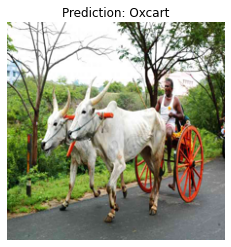

In [12]:
# Show the image and prediction
plt.imshow(image1)
plt.axis('off')
predicted_class_name = imagenet_labels[predicted_class]
_ = plt.title("Prediction: " + predicted_class_name.title())

## **Predict and Display Function**

In [13]:
def predict_display_image(imagex):
  result = classifier.predict(imagex[np.newaxis, ...])
  predicted_class = np.argmax(result[0], axis=-1)
  plt.imshow(imagex)
  plt.axis('off')
  predicted_class_name = imagenet_labels[predicted_class]
  _, plt.title("Prediction: " + predicted_class_name.title())

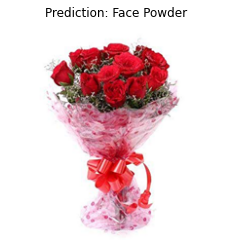

In [14]:
# predict and print results for image2
predict_display_image(image2)

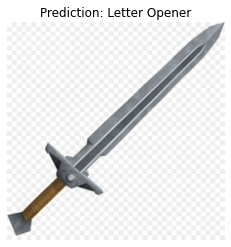

In [15]:
# predict and print results for image3
predict_display_image(image3)

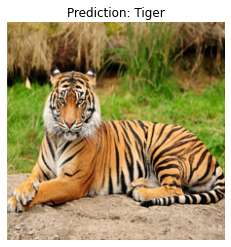

In [16]:
# predict and print results for image4
predict_display_image(image4)

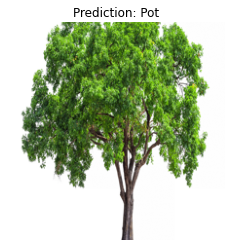

In [17]:
# predict and print results for image5
predict_display_image(image5)

In [18]:
# print the entire list of categories
for i in range(len(imagenet_labels)):
  print(imagenet_labels[i])

background
tench
goldfish
great white shark
tiger shark
hammerhead
electric ray
stingray
cock
hen
ostrich
brambling
goldfinch
house finch
junco
indigo bunting
robin
bulbul
jay
magpie
chickadee
water ouzel
kite
bald eagle
vulture
great grey owl
European fire salamander
common newt
eft
spotted salamander
axolotl
bullfrog
tree frog
tailed frog
loggerhead
leatherback turtle
mud turtle
terrapin
box turtle
banded gecko
common iguana
American chameleon
whiptail
agama
frilled lizard
alligator lizard
Gila monster
green lizard
African chameleon
Komodo dragon
African crocodile
American alligator
triceratops
thunder snake
ringneck snake
hognose snake
green snake
king snake
garter snake
water snake
vine snake
night snake
boa constrictor
rock python
Indian cobra
green mamba
sea snake
horned viper
diamondback
sidewinder
trilobite
harvestman
scorpion
black and gold garden spider
barn spider
garden spider
black widow
tarantula
wolf spider
tick
centipede
black grouse
ptarmigan
ruffed grouse
prairie chic

In [19]:
(224, 224) + (3, )

(224, 224, 3)

# **Dog Breed Classifier**

In [20]:
!pip install matplotlib==2.2.3

     |████████████████████████████████| 12.6 MB 4.2 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.6.0 requires matplotlib>=3.1.1, but you have matplotlib 2.2.3 which is incompatible.
mizani 0.6.0 requires matplotlib>=3.1.1, but you have matplotlib 2.2.3 which is incompatible.
arviz 0.11.4 requires matplotlib>=3.0, but you have matplotlib 2.2.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [21]:
import tensorflow as tf 
import tensorflow_hub as hub 
import matplotlib
print(matplotlib.__version__)

3.2.2


## **Loading Data** 

In [22]:
# Warning - As the data file is large, a few checks are disabled
# during download. If in any DOUBTS, download data using your
# own security measures
! wget --no-check-certificate -r 'https://drive.google.com/uc?export=download&id=11t-eBwdXU9EWriDhyhFBuMqHYiQ4gdae' -O dogbreed

will be placed in the single file you specified.

--2021-12-31 01:47:52--  https://drive.google.com/uc?export=download&id=11t-eBwdXU9EWriDhyhFBuMqHYiQ4gdae
Resolving drive.google.com (drive.google.com)... 142.250.128.102, 142.250.128.139, 142.250.128.138, ...
Connecting to drive.google.com (drive.google.com)|142.250.128.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘dogbreed’

dogbreed                [ <=>                ]   3.21K  --.-KB/s    in 0s      

2021-12-31 01:47:52 (37.6 MB/s) - ‘dogbreed’ saved [3290]

Loading robots.txt; please ignore errors.
--2021-12-31 01:47:52--  https://drive.google.com/robots.txt
Reusing existing connection to drive.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/plain]
Saving to: ‘dogbreed’

dogbreed                [ <=>                ]     570  --.-KB/s    in 0s      

2021-12-31 01:47:52 (79.6 MB/s) - ‘dogbreed’ saved [570]

--2021-12-31 01

In [23]:
# Extract file contents
!unzip dogbreed

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

In [24]:
# Check the labels 
import pandas as pd
labels_csv = pd.read_csv("/content/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [25]:
# Examine the table
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,a44001de312c09b1e8d14099c7553cf8,scottish_deerhound
freq,1,126


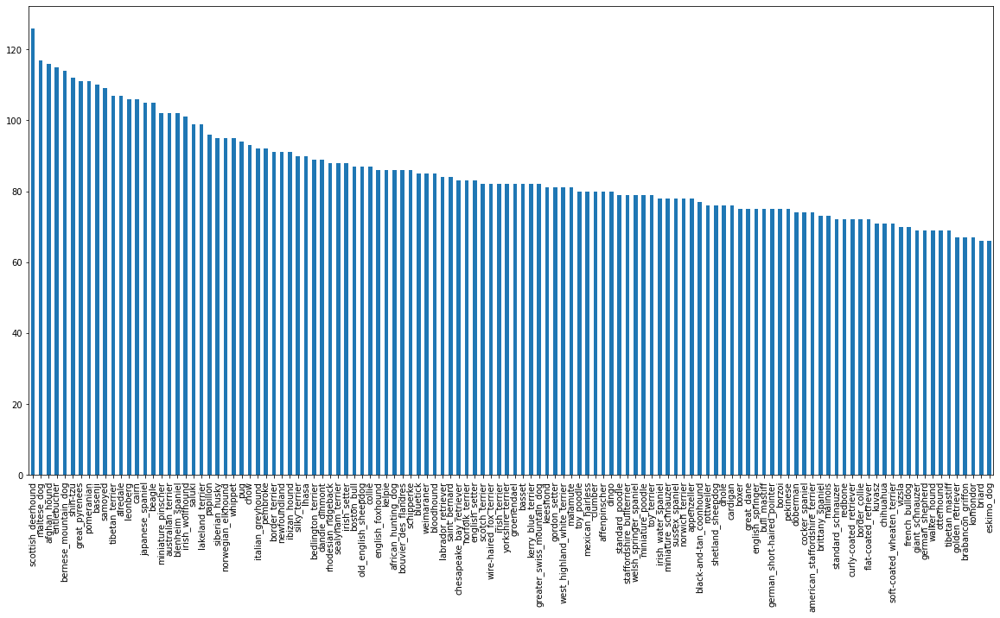

In [26]:
# How many images are there for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

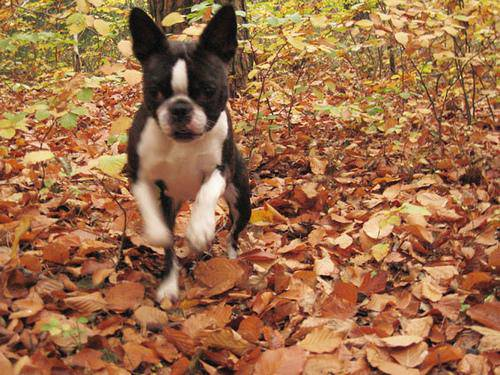

In [27]:
# print sample image
from IPython.display import display, Image
Image('/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## **Setting Up Data Paths**

In [28]:
# Define our training file path for ease of use
train_path = "/content/train"

In [29]:
# Create path names from image ID's 
filenames = [train_path + '/' + fname + ".jpg" for fname in labels_csv["id"]]

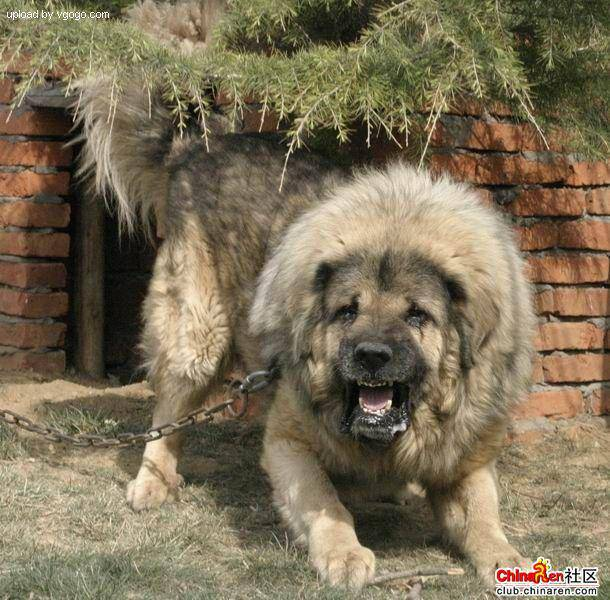

In [30]:
# Check an image directly from a file path
Image(filenames[9000])

In [31]:
# Extract unique labels
import numpy as np
labels = labels_csv['breed'].to_numpy()
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [32]:
# print categories
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [33]:
# Encode target labels with values between 0 and 120
from sklearn.preprocessing import LabelEncoder 
labels = LabelEncoder().fit_transform(labels).reshape(-1, 1)
labels

array([[19],
       [37],
       [85],
       ...,
       [ 3],
       [75],
       [28]])

In [34]:
# Use one hot encoding to convert categorical values
from sklearn.preprocessing import OneHotEncoder 
boolean_labels = OneHotEncoder().fit_transform(labels).toarray()

In [35]:
# Examine sample record
boolean_labels[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0.])

In [36]:
# Set up features for variables and labels
X = filenames
y = boolean_labels

In [37]:
# Create training/validation datasets
from sklearn.model_selection import train_test_split

# Split them into training and validation 
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

## **Preprocessing Images**

In [38]:
# Define image size 
IMG_SIZE = 224

def process_image(image_path):
  """
      Take an image file path and turns it into a Tensor.
  """

  # Read image file 
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [39]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
    Take an image file path name and associated label,
    process the image and return a tuple of (image, label).
  
  """

  image = process_image(image_path)
  return image, label

## **Creating Batches of Data**

In [40]:
# Define the batch size, 32 is a good default 
BATCH_SIZE = 32

# Create a function to turn data batches into batches
def create_data_batches(x, y = None, batch_size = BATCH_SIZE, data_type=1):
  """ 
    Creates batches of data out of image (x) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle it
    if it's validation data.
    Also accepts test data as input (no labels).

  """

  # If the data is a test dataset, we don't have labels
  if data_type == 3:
    print("Creating test data batches ..... ")
    # only file paths
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch 

  # if the data is a valid dataset, we don't need to shuffle it
  elif data_type == 2:
    print("Creating validation data batches ...... ")
    # x are file paths, y are labels
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batches = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batches

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches ........ ")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function 
    # is faster than shuffling images
    data = data.shuffle(buffer_size= len(x))

    # Create (image, label) tuples
    # (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches 
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


##**Visualizing Data Batch**

In [41]:
# Function for viewing image in a data batch
import matplotlib.pyplot as plt 

def show_25_images(images, labels):
  """ 
    Display 25 images from data batch
  """
  # Setup the figure 
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for diplaying 25 images)
  for i in range(1, 26):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn grid lines off
    plt.axis("off")

## **Defining a Model**

In [42]:
# Setup input shape to the model
# batch, height, width, color channels
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of the model
# number of unique labels
OUTPUT_SHAPE = len(unique_breeds)

# Setup the model URL from the tensor_hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [43]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  # Tensorflow Hub Layer
  # Output layer
  model = tf.keras.Sequential([
            hub.KerasLayer(MODEL_URL),
            tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

## **Model Summary**

In [44]:
# Create a model and print its summary
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## **Creating a DataSet**

In [45]:
# Create training dataset Tensor
training_data = create_data_batches(X_train, y_train) 

Creating training data batches ........ 


In [46]:
# Create validation dataset Tensor
val_data = create_data_batches(X_val, y_val)

Creating training data batches ........ 


In [47]:
# Visualize training images from the training data batch
train_images, train_labels = next(training_data.as_numpy_iterator())


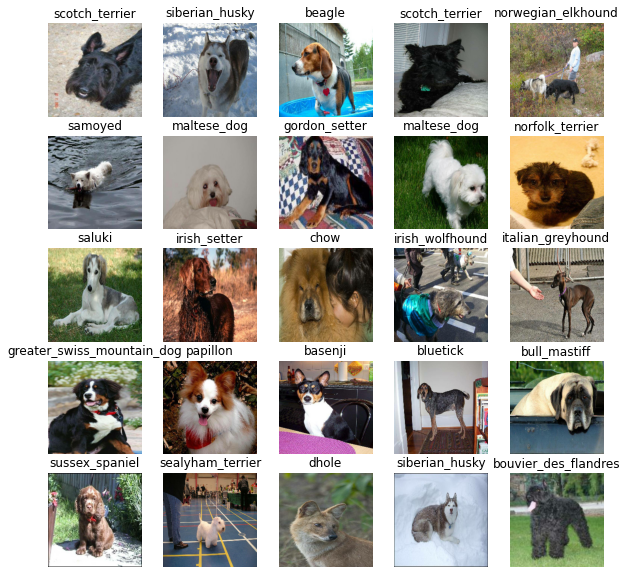

In [48]:
show_25_images(train_images, train_labels)

## **Setting Up Tensorboard**

In [49]:
# Load the Tensorboard notebook extension
%load_ext tensorboard

In [50]:
# cleaning the previous log
!rm -rf ./logs/

In [51]:
import datetime 
import os 

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for sorting Tensorboard logs
  logdir = os.path.join("logs", 
                        # Time stamp the log 
                        datetime.datetime.now().strftime("%Y%m%d - %H%M%S")) 
  return tf.keras.callbacks.TensorBoard(logdir)

In [52]:
# Tensorboard callback 
model_tensorboard = create_tensorboard_callback()

# Early stopping callback
model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', 
                                                        # stops after 3 rounds
                                                        # of no improvements
                                                        patience=3)

## **Model Training**

In [53]:
# Construct model
model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [54]:
NUMBER_EPOCHS = 100
model.fit(x = training_data, epochs=NUMBER_EPOCHS, validation_data=val_data, callbacks=[model_tensorboard, model_early_stopping])

Epoch 1/100
256/256 [==============================] - 61s 216ms/step - loss: 1.5086 - accuracy: 0.6353 - val_loss: 0.7066 - val_accuracy: 0.7941
Epoch 2/100
256/256 [==============================] - 46s 179ms/step - loss: 0.4096 - accuracy: 0.8828 - val_loss: 0.6531 - val_accuracy: 0.8015
Epoch 3/100
256/256 [==============================] - 42s 165ms/step - loss: 0.2356 - accuracy: 0.9396 - val_loss: 0.6273 - val_accuracy: 0.8088
Epoch 4/100
256/256 [==============================] - 44s 173ms/step - loss: 0.1502 - accuracy: 0.9691 - val_loss: 0.6344 - val_accuracy: 0.8152
Epoch 5/100
256/256 [==============================] - 44s 173ms/step - loss: 0.1017 - accuracy: 0.9824 - val_loss: 0.6367 - val_accuracy: 0.8171
Epoch 6/100
256/256 [==============================] - 42s 165ms/step - loss: 0.0718 - accuracy: 0.9910 - val_loss: 0.6525 - val_accuracy: 0.8122
Epoch 7/100
256/256 [==============================] - 44s 173ms/step - loss: 0.0534 - accuracy: 0.9963 - val_loss: 0.6754 -

In [55]:
%tensorboard --logdir logs 

<IPython.core.display.Javascript object>

## **Evaluating Model Performance**

In [56]:
# Evaluate performance on validation data 
model.evaluate(val_data)

64/64 [==============================] - 9s 132ms/step - loss: 0.7932 - accuracy: 0.8108


[0.7931604385375977, 0.8107579350471497]

## **Predicting Images in Test Data**

In [57]:
# set up path to test images
test_path = "/content/test"
test_filenames = [test_path + '/' + fname  for fname in os.listdir(test_path)]
# prepare test dataset 
test_data = create_data_batches(test_filenames, data_type=3)

Creating test data batches ..... 


In [58]:
predictions = model.predict(test_data, verbose=1)

324/324 [==============================] - 43s 131ms/step


In [59]:
# Check how many images are tested
predictions.shape

(10357, 120)

In [60]:
# Print the prediction for the first image
predictions[0]

array([4.38808939e-07, 2.16684612e-06, 4.96234946e-08, 9.49939789e-08,
       3.70148715e-04, 1.16786407e-03, 4.29039630e-08, 1.94908316e-05,
       4.20666630e-08, 1.39524900e-06, 2.27648044e-07, 2.13033200e-05,
       2.72908920e-07, 1.38123332e-05, 1.46869850e-08, 1.47161154e-05,
       7.15816393e-02, 1.79527699e-08, 1.67591065e-06, 3.75506142e-03,
       3.00742400e-08, 4.26815454e-08, 6.16042284e-09, 1.26477596e-06,
       4.01682264e-05, 1.05785027e-07, 1.72241532e-09, 4.62378011e-05,
       1.02009643e-07, 2.77036020e-06, 3.45157538e-08, 2.04419237e-07,
       1.25718617e-03, 9.04714882e-01, 2.51799770e-06, 4.22204550e-07,
       3.27778622e-08, 1.72804882e-09, 1.23107968e-08, 4.54929989e-07,
       1.71479583e-03, 5.67545928e-03, 8.52730682e-06, 8.57345913e-06,
       9.85611841e-05, 1.64673935e-07, 1.41460665e-08, 4.30056986e-07,
       5.74850731e-07, 2.17526795e-05, 4.16291050e-06, 2.94271667e-05,
       2.93750109e-05, 1.43326921e-04, 4.77023605e-07, 3.23534579e-07,
      

In [61]:
# the max probability value predicted by the model
print(f"Max value: {np.max(predictions[0])}")
# the index where the max value in predictions[0] occurs
print(f"Max index: {np.argmax(predictions[0])}")
# the predicted label
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

Max value: 0.9047148823738098
Max index: 33
Predicted label: collie


## **Visualizing Prediction Results**

In [62]:
# Function to plot image and the prediction
def plot_pred(prediction_probabilities, images):
  image = process_image(images)
  pred_label = unique_breeds[np.argmax(prediction_probabilities)]
  plt.imshow(image)
  plt.axis('off')
  plt.title(pred_label)

In [63]:
# function to print bar chart of predictions
def plot_pred_conf(prediction_probabilities):
  top_10_pred_indexes = prediction_probabilities.argsort()[-10:][::-1]
  top_10_pred_values = prediction_probabilities[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  top_plot[0].set_color("green")


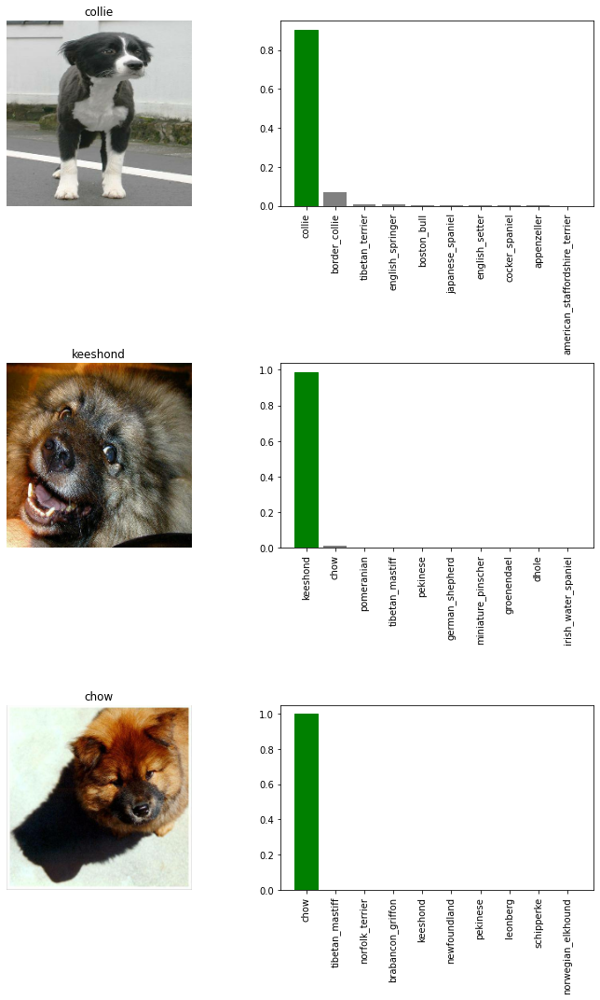

In [64]:
# print results for first three predictions
num_rows = 3
plt.figure(figsize=(5*2, 5* num_rows))
for i in range(num_rows):
  plt.subplot(3, 2, 2*i+1)
  plot_pred(prediction_probabilities=predictions[i], images=test_filenames[i])

  plt.subplot(3, 2, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions[i])

plt.tight_layout(h_pad=1.0)
plt.show()

## **Predicting Unseen Images**

In [65]:
# download unseen image for testing
!pip install wget
url='https://raw.githubusercontent.com/Apress/artificial-neural-networks-with-tensorflow-2/main/Ch04/tiger.jpg'

import wget 
wget.download(url,'tiger.jpg')

'tiger.jpg'

In [66]:
# process the image and convert into a Tensor
data = create_data_batches(['/content/tiger.jpg'], batch_size=1, data_type=3) 


Creating test data batches ..... 


In [67]:
# infer the image 
result = model.predict(data)

In [68]:
# get the prediction
predict_class_index = np.argmax(result[0], axis=-1)
predict_class_name = unique_breeds[(predict_class_index)]

In [69]:
def predict_prob(number):
  return [number[0],1-number[0]]

y_prob = np.array(list(map(predict_prob, model.predict(data))))
y_prob 

array([[3.39275284e-04, 9.99660725e-01]])

In [70]:
# Check the threshold for prediction value
if result.max() > 0.7:
  print(predict_class_name)
else:
  print("Not a dog breed as predicted probability is {}".format(result.max()))

Not a dog breed as predicted probability is 0.45497792959213257


In [71]:
predict_class_name

'staffordshire_bullterrier'

In [72]:
result = model.predict(data)

In [73]:
result.max()

0.45497793

## **Training with Smaller DataSets**

In [74]:
# array to hold the evaluation results
model_performances = []

# function for training the given model on specified
# number of images
def train_model(model, NUM_IMAGES):
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, callbacks=[model_tensorboard, model_early_stopping])

In [75]:
# Training
NUM_EPOCHS = 100
# Create models and test for 1000, 2000, 3000, 4000 images
for NUM_IMAGES in range(1000, 5000, 1000):
  model = create_model()
  x_train, x_val, y_train, y_val=train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=10)
  train_data=create_data_batches(x_train, y_train, batch_size=10)
  val_data=create_data_batches(x_val, y_val, batch_size=10, data_type=2)
  train_model(model, NUM_IMAGES)
  model_performances.append(model.evaluate(val_data))



Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Creating training data batches ........ 
Creating validation data batches ...... 
Epoch 1/100
25/25 [==============================] - 10s 228ms/step - loss: 4.5416 - accuracy: 0.0900 - val_loss: 3.2805 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 5s 187ms/step - loss: 1.6085 - accuracy: 0.6988 - val_loss: 2.0675 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 4s 172ms/step - loss: 0.5603 - accuracy: 0.9463 - val_loss: 1.5810 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 5s 187ms/step - loss: 0.2433 - accuracy: 0.9912 - val_loss: 1.4313 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 6s 249ms/step - loss: 0.1421 - accuracy: 0.9987 - val_loss: 1.3472 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 7s 284ms/step - loss: 0.0951 - accuracy: 1.0000 - val_l

In [77]:
model_performances

[[1.2406306266784668, 0.6650000214576721],
 [0.8951845765113831, 0.7300000190734863],
 [0.8461736440658569, 0.7633333206176758],
 [0.7977224588394165, 0.7699999809265137]]

In [78]:
# load the metrics in pandas dataframe
import pandas as pd
comp = pd.DataFrame(model_performances, index = [1000, 2000, 3000, 4000], columns=['val_loss', 'val_acc'])

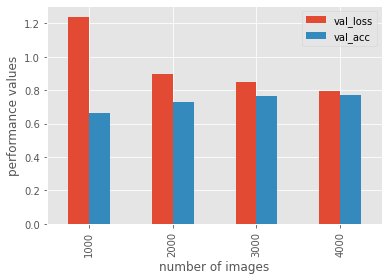

In [79]:
# plot the table 
import matplotlib.pyplot as plt 
plt.style.use('ggplot')
comp.plot.bar()
plt.xlabel('number of images')
plt.ylabel('performance values')
plt.show()

## **Saving the Model**

In [80]:
# Saving model
model.save('model.h5')

In [81]:
# Loading model
from tensorflow.keras.models import load_model 
model = load_model('model.h5', custom_objects={"KerasLayer":hub.KerasLayer})

In [82]:
# Summary of model 

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_6 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_5 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________
